## Bienvenido a la primera práctica de Jupyter Notebook

Esta primera práctica se realizará sobre los datos obtenidos de la página de [datos](http://insideairbnb.com/get-the-data.html) de AirBnB

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/jpcano1/MINE-4101-tareas/blob/master/lab_1.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png"/>Run in Google Colab</a>
  </td>
</table>

## **Preguntas**

1. Realizar un "enriquecimiento" de información, utilizando los datos que se encuentra en la página de [AirBnB](http://insideairbnb.com/get-the-data.html), para tal fin,  utilice la función [merge](http://www.datasciencemadesimple.com/join-merge-data-frames-pandas-python/).
2. Seleccione un conjunto de variables que pueda ser de interés.
3. Teniendo en cuenta los resultados del ítem 2, realizar un análisis y el tratamiendo adecuado en función del tipo de variables, datos faltantes y datos duplicados.
4. Formule 4 hipótesis que se puedan abarcar sobre el conjunto de datos resultantes en el punto anterior, y de ser prosible dar respuesta a estas utilizando pandas profiling.

In [ ]:
!pip install -q https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import requests

import pandas_profiling

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [4]:
url = "http://data.insideairbnb.com/the-netherlands/north-holland/amsterdam/2019-07-08/data/listings.csv.gz"
url1 = "http://data.insideairbnb.com/the-netherlands/north-holland/amsterdam/2019-07-08/visualisations/listings.csv"

In [5]:
def download_data(url, filename="listings.csv.gz"):
    r = requests.get(url)
    with open(filename, "wb") as f:
        f.write(r.content)
    return 

In [6]:
download_data(url)
download_data(url1, "listings_1.csv")

In [7]:
columns = ['id','room_type', 'bathrooms', 'bedrooms', 'bed_type', 'price', 
           'weekly_price', 'monthly_price', 'security_deposit', 'city', 
           'state', 'country','first_review','last_review', 
           'review_scores_rating', 'number_of_reviews','has_availability', 
           'availability_30', 'availability_60', 'availability_90', 
           'availability_365']

### **1. Enriquecimiento de datos**

In [8]:
listings = pd.read_csv("listings.csv.gz", low_memory=False)[columns]
listings_1 = pd.read_csv("listings_1.csv", low_memory=False)

In [19]:
complete_data = pd.merge(listings, listings_1, on="id")

In [10]:
complete_data.columns

Index(['id', 'room_type_x', 'bathrooms', 'bedrooms', 'bed_type', 'price_x',
       'weekly_price', 'monthly_price', 'security_deposit', 'city', 'state',
       'country', 'first_review', 'last_review_x', 'review_scores_rating',
       'number_of_reviews_x', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'availability_365_x', 'name',
       'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type_y', 'price_y', 'minimum_nights',
       'number_of_reviews_y', 'last_review_y', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365_y'],
      dtype='object')

### **2. Conjunto de variables de interés**
```python
Index(['id', 'room_type_x', 'bathrooms', 'bedrooms', 'bed_type', 'price_x',
       'city', 'state', 'review_scores_rating', 'number_of_reviews_x',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365_x', 'host_id', 'neighbourhood', 'reviews_per_month'],
      dtype='object')
```

In [11]:
columns_to_remove = ["availability_365_y", "host_name", "neighbourhood_group", 
                     "number_of_reviews_y", "last_review_y", "room_type_y", 
                     "price_y", "name", "calculated_host_listings_count", 
                     "latitude", "longitude", "weekly_price", "monthly_price", 
                     "security_deposit", "first_review", "last_review_x",
                     "has_availability", "country", "minimum_nights"]

In [20]:
complete_data.drop(columns=columns_to_remove, axis=1, inplace=True)

In [21]:
complete_data.columns

Index(['id', 'room_type_x', 'bathrooms', 'bedrooms', 'bed_type', 'price_x',
       'city', 'state', 'review_scores_rating', 'number_of_reviews_x',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365_x', 'host_id', 'neighbourhood', 'reviews_per_month'],
      dtype='object')

### **3. Análisis y tratamiento**

In [ ]:
complete_data.drop_duplicates(inplace=True)

In [23]:
complete_data.dropna(inplace=True)

In [38]:
complete_data["price_x"] = complete_data["price_x"].apply(lambda x: np.float(x[1:].split(".")[0].replace(",", ".")))

### **4. Verificación con Pandas Profiling**
- **Hipótesis**:
    - Entre más baños, mejor calificación.
    - Entre más habitaciones, mejor calificación.
    - Entre más baños o más habitaciones más caro.
    - Dependiendo de la ciudad, es más caro.

In [40]:
profile = pandas_profiling.ProfileReport(complete_data, title="Pandas Profiling Report", html={"style": {"full_width": True}})

In [46]:
profile.to_notebook_iframe()

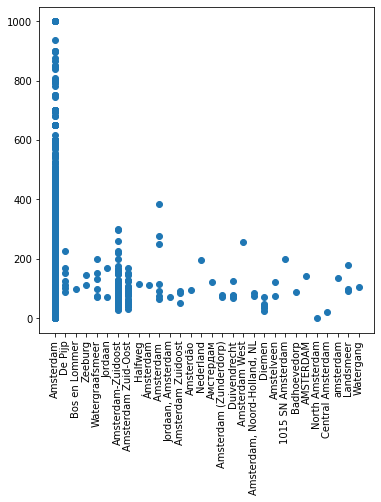

In [60]:
plt.figure(figsize=(6, 6))

plt.scatter(complete_data["city"], complete_data["price_x"])
plt.xticks(rotation=90)
plt.show()

- Se puede ver como resultado, que la primera hipótesis tuvo una correlación interesante con el puntaje, igual que la segunda hipótesis
- La tercera hipótesis no fue cierta, dado que aunque haya buena cantidad de baños o de alcobas, la puntuación puede resultar no muy buena.
- La última, aunque no se pudo probar con pandas profiling, se pudo comprobar con un gráfico simple, y es que dependiendo de la ciudad, el precio puede ser más caro, en Amsterdam se registraron los precios más altos.